# Generalisation to DR16Q superset

In [1]:
using CSV, DataFrames, HDF5, Random, Statistics, Plots, Printf, StatsBase, StatsPlots

In [2]:
include("BayesianSZNet.jl")
using .BayesianSZNet

In [3]:
superset = h5open("data/dr16q_superset.hdf5", "r")
id = read(superset, "id")
n = size(id, 2)
X = read(superset, "X")
df = DataFrame(
    plate=id[1, :],	mjd=id[2, :], fiberid=id[3, :],
    z=read(superset, "z"),
    source_z=read(superset, "source_z"),
    z_vi=read(superset, "z_vi"),
    z_pipe=read(superset, "z_pipe"),
    zwarning=read(superset, "zwarning"),
    z_dr12q=read(superset, "z_dr12q"),
    z_dr7q_sch=read(superset, "z_dr7q_sch"),
    z_dr6q_hw=read(superset, "z_dr6q_hw"),
    z_10k=read(superset, "z_10k"),
    pipe_corr_10k=read(superset, "pipe_corr_10k"),
    z_pca=read(superset, "z_pca"),
    z_qn=read(superset, "z_qn"),
    sn=read(superset, "sn_median_all"),
    is_qso_final=read(superset, "is_qso_final"),
    idx_10k=read(superset, "idx_10k"))
ẑs = read(superset, "zs_pred")
df.ẑ = dropdims(mean(ẑs, dims=1), dims=1)
df.var = dropdims(var(ẑs, dims=1), dims=1)
close(superset)
df

,plate,mjd,fiberid,z,source_z,z_vi,z_pipe,zwarning,z_dr12q
,Int32,Int32,Int32,Float32,String,Float32,Float32,Int32,Float32
1,266,51630,3,0.652926,DR6Q_HW,-1.0,-1.0,-1,-1.0
2,266,51630,58,1.47499,DR6Q_HW,-1.0,-1.0,-1,-1.0
3,266,51630,80,1.77284,DR6Q_HW,-1.0,-1.0,-1,-1.0
4,266,51630,126,0.518666,DR6Q_HW,-1.0,-1.0,-1,-1.0
5,266,51630,161,0.325738,DR6Q_HW,-1.0,-1.0,-1,-1.0
6,266,51630,200,0.288773,DR6Q_HW,-1.0,-1.0,-1,-1.0
7,266,51630,208,1.36284,DR6Q_HW,-1.0,-1.0,-1,-1.0
8,266,51630,225,1.62085,DR6Q_HW,-1.0,-1.0,-1,-1.0
9,266,51630,238,1.58165,DR6Q_HW,-1.0,-1.0,-1,-1.0


In [4]:
function preview(df, X, i)
    spec = df[i, :]
    label = @sprintf(
        "spec-%04d-%5d-%04d.fits\nprimary Z = %.3f\nSOURCE_Z = %s\nIS_QSO_FINAL = %d\nẑ = %.3f\ns² = %.6f",
        spec.plate, spec.mjd, spec.fiberid,
        spec.z, spec.source_z, spec.is_qso_final, spec.ẑ, spec.var)
    plot_spectrum(X[:, i], label=label)
    plot_spectral_lines!(spec.z)
    plot_spectral_lines!(spec.ẑ, color=:red, location=:bottom)
end

preview (generic function with 1 method)

## $z > 5.216$

In [5]:
idx_high_z = df.z .> 5.216
sum(idx_high_z)

3645

In [6]:
countmap(df.source_z[idx_high_z])

Dict{String,Int64} with 3 entries:
  "DR6Q_HW" => 3
  "PIPE"    => 3613
  "VI"      => 29

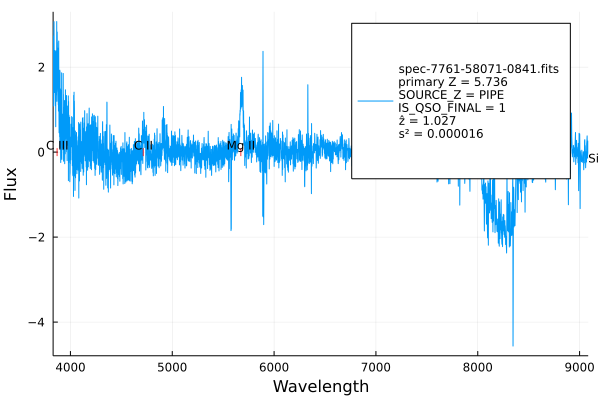

In [7]:
preview(df, X, 1103197)

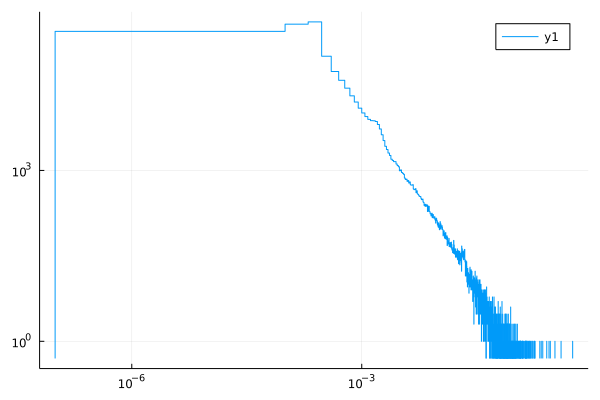

In [8]:
histogram(df.var, xscale=:log10, yscale=:log10)

## Random visual inspection of 10k spectra

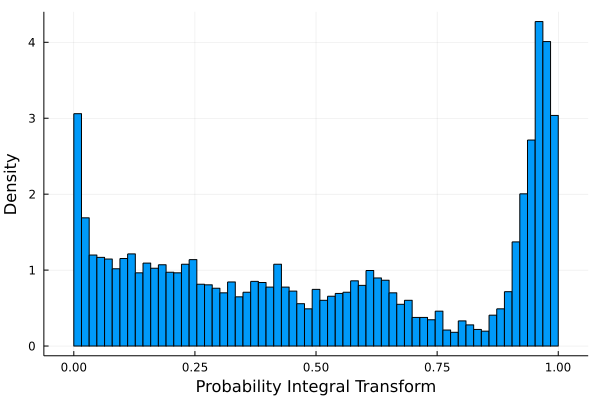

(0.038736712f0, 0.18944592755107154)

In [9]:
df_10k = df[df.idx_10k, :]
X_10k = X[:, df.idx_10k]
ẑs_10k = ẑs[:, df.idx_10k]
ẑ_10k = reshape(df_10k.ẑ, 1, :)
z_10k = reshape(df_10k.z_10k, 1, :)
z_pipe_10k = reshape(df_10k.z_pipe, 1, :)
z_pca_10k = reshape(df_10k.z_pca, 1, :)
z_qn_10k = reshape(df_10k.z_qn, 1, :)

display(pithist(z_10k, ẑs_10k))
mcrps(z_10k, ẑs_10k), rmse(z_10k, ẑ_10k)

In [10]:
mcrps(z_10k, z_pipe_10k), rmse(z_10k, z_pipe_10k)

(0.026046619f0, 0.22886184109250143)

In [11]:
mcrps(z_10k, z_pca_10k), rmse(z_10k, z_pca_10k)

(0.024512982f0, 0.21143056630755902)

In [12]:
idx_qn_10k = view(z_qn_10k .> -1, :)
mcrps(z_10k[:, idx_qn_10k], z_qn_10k[:, idx_qn_10k]),
rmse(z_10k[:, idx_qn_10k], z_qn_10k[:, idx_qn_10k])

(0.1584285f0, 0.5406336846856777)

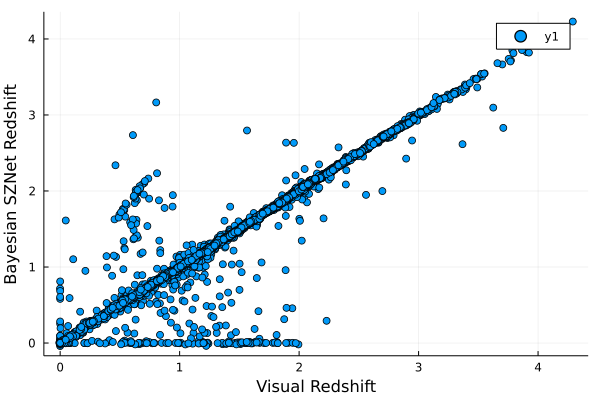

In [13]:
@df df_10k scatter(:z_10k, :ẑ, xlabel="Visual Redshift", ylabel="Bayesian SZNet Redshift")

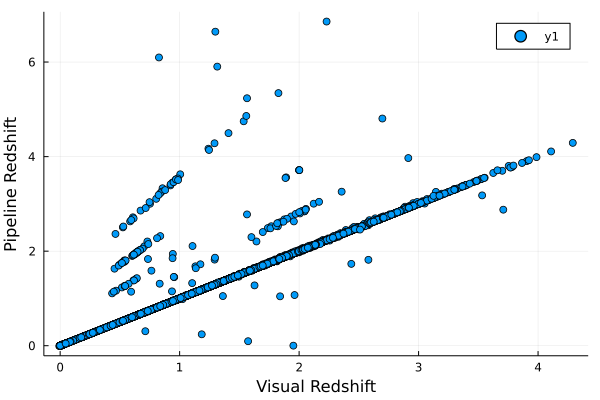

In [14]:
@df df_10k scatter(:z_10k, :z_pipe, xlabel="Visual Redshift", ylabel="Pipeline Redshift")

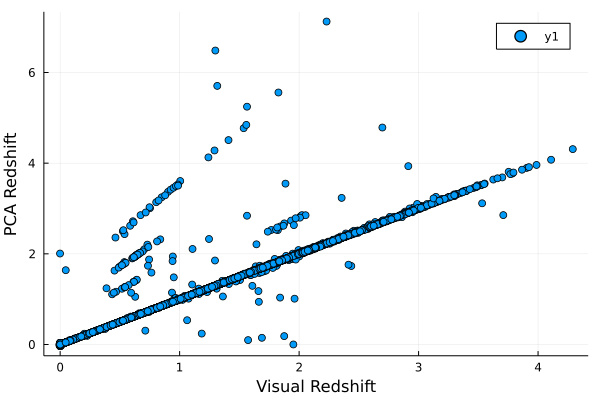

In [15]:
@df df_10k scatter(:z_10k, :z_pca, xlabel="Visual Redshift", ylabel="PCA Redshift")

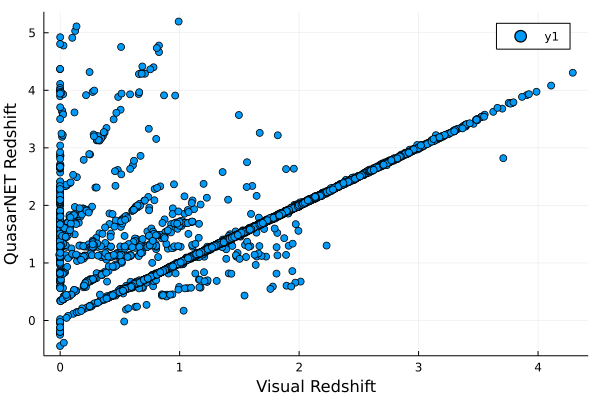

In [16]:
@df df_10k scatter(
    :z_10k[idx_qn_10k], :z_qn[idx_qn_10k],
    xlabel="Visual Redshift", ylabel="QuasarNET Redshift")

In [17]:
is = (1:n)[(df.sn .> 25) .& (df.var .> 1.0e-3) .& (abs.((df.ẑ .- df.z) ./ (1 .+ df.z)) .> 0.1) .& (df.source_z .!= "PIPE")]
size(is)

(153,)

## Utilisation of uncertainties

In [18]:
ts = 0.0001:0.0001:maximum(df_10k.var)

0.0001:0.0001:0.0868

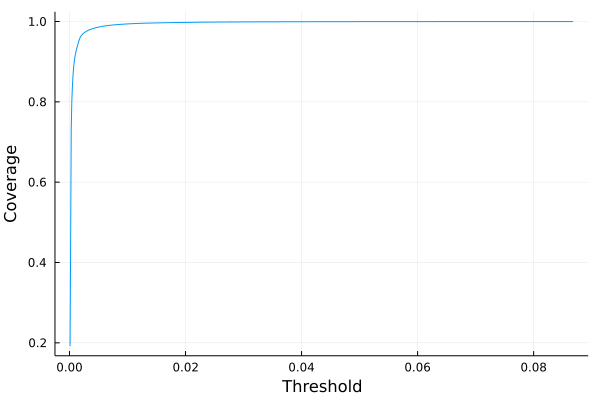

In [19]:
n = size(df, 1)
coverages = [sum(df.var .< t) / n for t in ts]
plot(ts, coverages, label=:none, xlabel="Threshold", ylabel="Coverage")

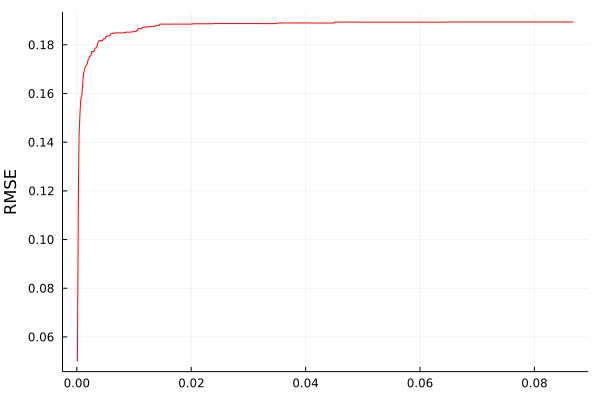

In [20]:
rmses = [rmse(z_10k[:, df_10k.var .< t], ẑ_10k[:, df_10k.var .< t]) for t in ts]
plot(ts, rmses, color="red", ylabel="RMSE", label=:none)

In [21]:
ceil(Int, n * 0.01), ceil(Int, n * 0.05), ceil(Int, n * 0.1)

(14406, 72029, 144058)

In [22]:
t_99 = 0.006644
idx_99, idx_99_10k = view(df.var .< t_99, :), view(df_10k.var .< t_99, :)
n - sum(idx_99),
mcrps(z_10k[:, idx_99_10k], ẑ_10k[:, idx_99_10k]),
rmse(z_10k[:, idx_99_10k], ẑ_10k[:, idx_99_10k])

(14406, 0.038895674f0, 0.18484867872406474)

In [23]:
t_95 = 0.00158186
idx_95, idx_95_10k = view(df.var .< t_95, :), view(df_10k.var .< t_95, :)
n - sum(idx_95),
mcrps(z_10k[:, idx_95_10k], ẑ_10k[:, idx_95_10k]),
rmse(z_10k[:, idx_95_10k], ẑ_10k[:, idx_95_10k])

(72029, 0.033404183f0, 0.1714135111686093)

In [24]:
t_90 = 0.00082251
idx_90, idx_90_10k = view(df.var .< t_90, :), view(df_10k.var .< t_90, :)
n - sum(idx_90),
mcrps(z_10k[:, idx_90_10k], ẑ_10k[:, idx_90_10k]),
rmse(z_10k[:, idx_90_10k], ẑ_10k[:, idx_90_10k])

(144058, 0.029285606f0, 0.15870607720224836)

## Catalogue

In [25]:
catalogue = DataFrame(
    plate=id[1, :],	mjd=id[2, :], fiberid=id[3, :],
    z_pred=df.ẑ,
    variance=df.var,
    z=df.z,
    source_z=df.source_z,
    is_qso_final=df.is_qso_final,
    z_vi=df.z_vi,
    z_pipe=df.z_pipe,
    zwarning=df.zwarning,
    z_dr12q=df.z_dr12q,
    z_dr7q_sch=df.z_dr7q_sch,
    z_dr6q_hw=df.z_dr6q_hw,
    z_10k=df.z_10k,
    z_pca=df.z_pca,
    z_qn=df.z_qn)
for i in 1:size(ẑs, 1)
    catalogue[!, "z_pred_$i"] = ẑs[i, :]
end
CSV.write("data/dr16q_superset_redshift.csv", sort(catalogue, :variance))
catalogue

,plate,mjd,fiberid,z_pred,variance,z,source_z,is_qso_final
,Int32,Int32,Int32,Float32,Float32,Float32,String,Int16
1,266,51630,3,0.624251,0.00035176,0.652926,DR6Q_HW,1
2,266,51630,58,1.46042,0.000109313,1.47499,DR6Q_HW,1
3,266,51630,80,1.76133,0.00354197,1.77284,DR6Q_HW,1
4,266,51630,126,0.508749,0.00182273,0.518666,DR6Q_HW,1
5,266,51630,161,0.258919,0.00054469,0.325738,DR6Q_HW,1
6,266,51630,200,0.2551,0.00044786,0.288773,DR6Q_HW,1
7,266,51630,208,1.53019,0.00313772,1.36284,DR6Q_HW,1
8,266,51630,225,1.62832,9.27863e-5,1.62085,DR6Q_HW,1
9,266,51630,238,1.58555,5.0209e-5,1.58165,DR6Q_HW,1


## Example spectra

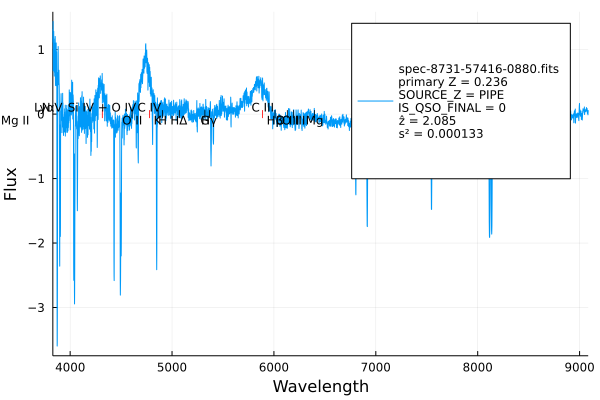

In [26]:
preview(df, X, 1327825)

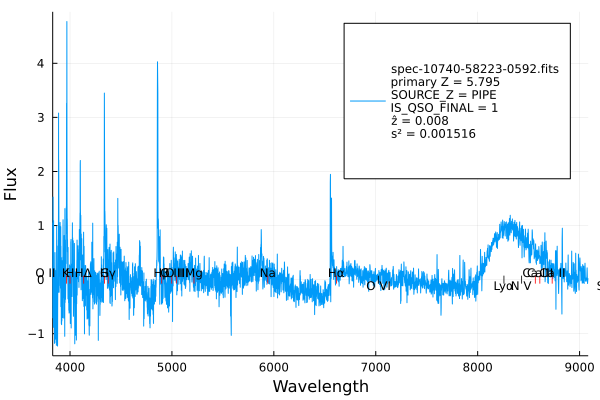

In [27]:
preview(df, X, 136790)

### QSOs

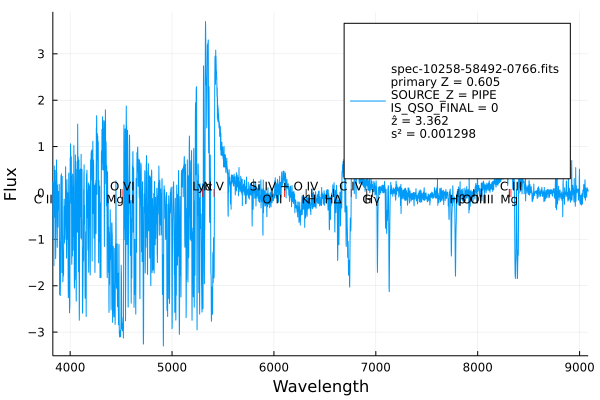

In [28]:
preview(df, X, 95993)

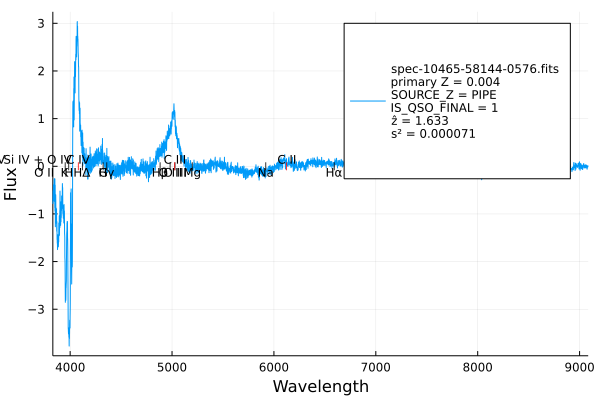

In [29]:
preview(df, X, 114188)

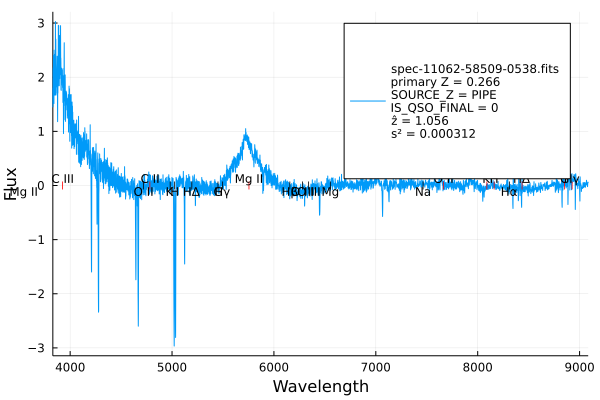

In [30]:
preview(df, X, 172376)

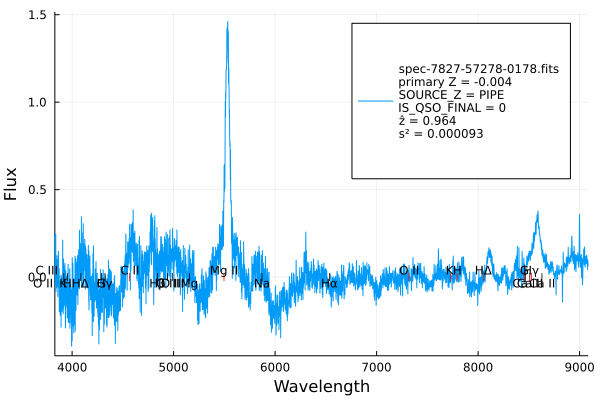

In [31]:
preview(df, X, 1113376)

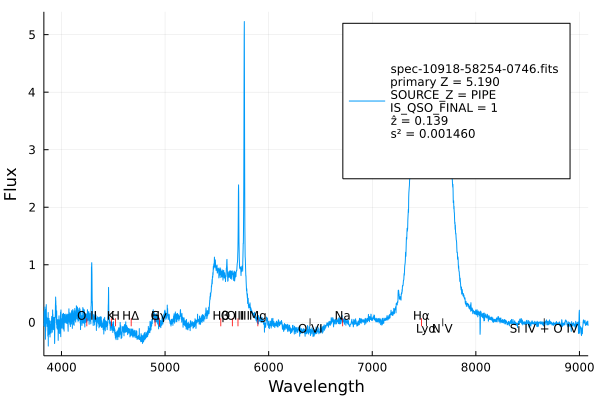

In [32]:
preview(df, X, 160337)

### Stars

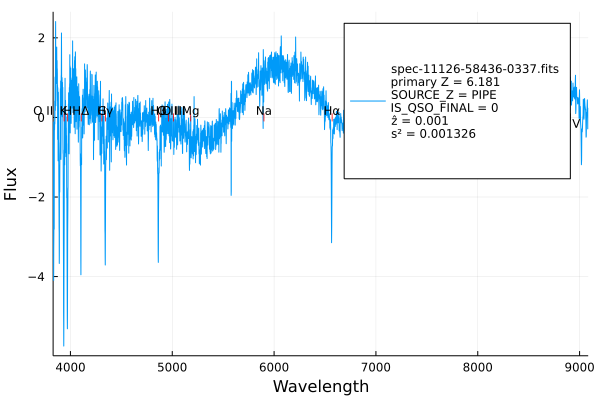

In [33]:
preview(df, X, 202316)

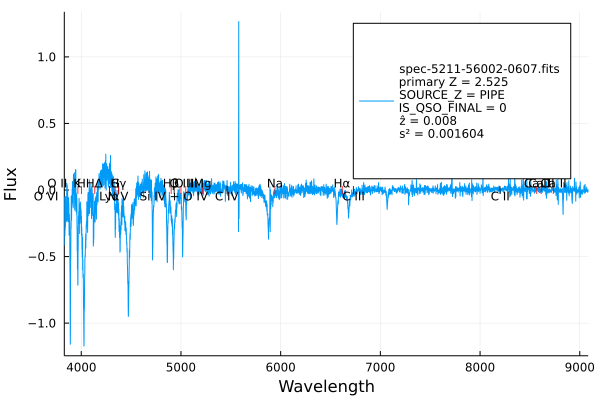

In [34]:
preview(df, X, 534267)

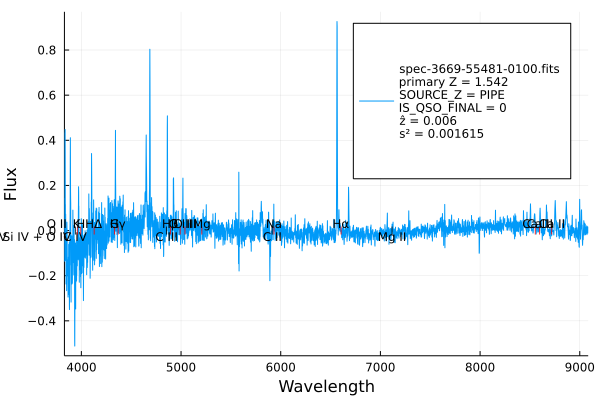

In [35]:
preview(df, X, 267587)

### Bayesian SZNet's incorrect predictions

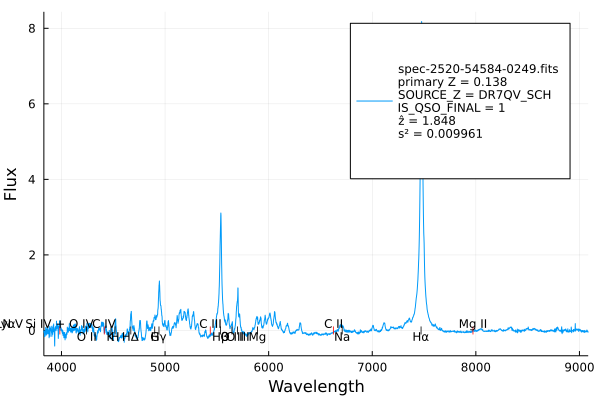

In [36]:
preview(df, X, 66523)

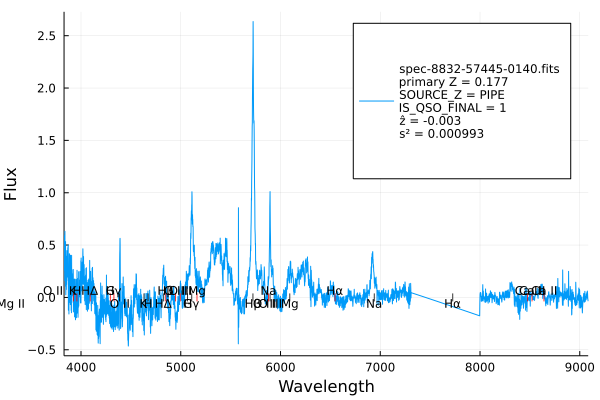

In [37]:
preview(df, X, 1359912)